### Student Information
Name: 江信彥 CHIANG Hsin-Yen

Student ID: 40990131M

GitHub ID: lemonade0715

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

---

## 1. Take-Home Exercises

### Data Preparation

In [1]:
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

In [2]:
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42)

In [3]:
import pandas as pd
import helpers.data_mining_helpers as dmh
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [4]:
# add category to the dataframe
X['category'] = twenty_train.target
# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

### Exercise 2

In [5]:
# Select data whose text is longer then 4000 characters
X[X['text'].str.len() > 40000]

,text,category,category_name
400,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,1,comp.graphics
433,From: tgl+@cs.cmu.edu (Tom Lane) Subject: JPEG...,1,comp.graphics
768,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,1,comp.graphics
1403,From: bobbe@vice.ICO.TEK.COM (Robert Beauchain...,0,alt.atheism
1890,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,1,comp.graphics


In [6]:
# Select data with category=2
X.query('category == 2')

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
16,"From: texx@ossi.com (Robert ""Texx"" Woodworth) ...",2,sci.med
28,From: rind@enterprise.bih.harvard.edu (David R...,2,sci.med
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


### Exercise 5

In [7]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                            },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [8]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [9]:
# Answer here

# Since 'NaN', 'None', '' are strings, .isnull() does not consider them null
[type(np.nan), type('NaN'), type('None'), type(None), type('')]

[float, str, str, NoneType, str]

### Exercise 6

In [10]:
# Data Preparation
X_sample = X.sample(n=1000)

In [11]:
X_sample

,text,category,category_name
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
740,From: a137490@lehtori.cc.tut.fi (Aario Sami) S...,0,alt.atheism
394,From: kardank@ERE.UMontreal.CA (Kardan Kaveh) ...,1,comp.graphics
1844,From: haberj@Informatik.TU-Muenchen.DE (Haber ...,1,comp.graphics
920,From: srlnjal@grace.cri.nz Subject: CorelDraw ...,1,comp.graphics
...,...,...,...
1207,From: coffey@cptc2.neep.wisc.edu (Robert L. Co...,3,soc.religion.christian
2214,From: tychay@cco.caltech.edu (Terrence Y. Chay...,1,comp.graphics
173,From: Rick_Granberry@pts.mot.com (Rick Granber...,3,soc.religion.christian
588,From: eylerken@stein.u.washington.edu (Ken Eyl...,1,comp.graphics


In [12]:
# Answer here

# The .sample(n=1000) method has randomly chosen 1000 rows in X, and the order of rows are not preserved

### Exercise 8

In [13]:
# Data Preparation
import matplotlib.pyplot as plt
%matplotlib inline

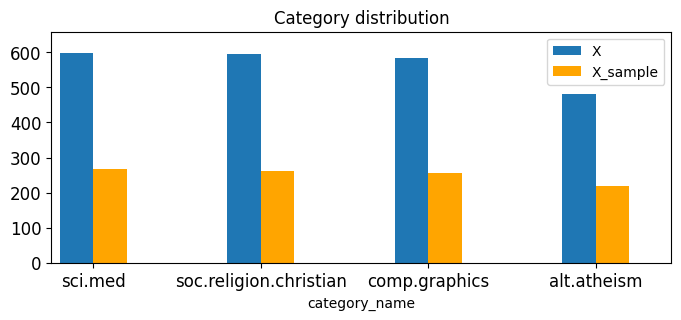

In [14]:
# Answer here

fig, ax = plt.subplots(figsize=(8, 3))
upper_bound = max(max(X.category_name.value_counts()), max(X_sample.category_name.value_counts())) * 1.1

X.category_name.value_counts().plot(kind='bar',
                                    ax=ax,
                                    position=1,
                                    width=0.2,
                                    title='Category distribution',
                                    ylim=[0, upper_bound], 
                                    rot=0, fontsize=12)

X_sample.category_name.value_counts().plot(kind='bar',
                                           ax=ax,
                                           color='orange',
                                           position=0,
                                           width=0.2,
                                           ylim=[0, upper_bound], 
                                           rot=0, fontsize=12)

plt.legend(['X', 'X_sample'])
plt.show()

### Exercise 10

In [15]:
# Setup
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /Users/work/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [16]:
# Data Preparation
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

In [17]:
# Find the position of 1 in the fifth record
print(np.where(X_counts[4, 0:100].toarray() == 1)) # position: 0 and 37
# See what is in position 37
count_vect.get_feature_names_out()[37]

(array([0, 0]), array([ 0, 37]))


'01'

### Exercise 11

In [18]:
# We choose the rows and cols with least zeros
matrix_size = 20
row_nnzcounts = np.array(X_counts.getnnz(axis=1))
col_nnzcounts = np.array(X_counts.getnnz(axis=0))
top_rows = np.argsort(-row_nnzcounts)[:matrix_size]
top_cols = np.argsort(-col_nnzcounts)[:matrix_size]

plot_x = ["term_"+str(i) for i in top_cols]
plot_y = ["doc_"+str(i) for i in top_rows]
plot_z = X_counts[top_rows][:, top_cols].toarray()
plot_z

array([[ 63,   2,   3, 249,   1, 135, 165, 109, 207, 114,  39,  76,   4,
        157,  45,  25,  35,  24,  16,  52],
       [ 58,  11,   4, 242,   1, 157,  89, 100, 185,  77,  25,  47,   3,
        133, 113,  37,  17,  12,  15,  45],
       [ 39,   1,   7, 200,   2, 103, 164,  69, 254,  90,  38,  87,   3,
        105,  30,  13,  36,  13,   8,  19],
       [ 72,   4,   2, 362,   2, 227, 190, 108, 150, 200,  85, 123,  10,
        117,  25,  91,  64,  55,  58, 190],
       [ 47,   2,   1, 589,   1, 281, 326, 135, 208, 174, 120, 111,   3,
         60,   0,  90,  58,  53,  98,  49],
       [ 28,   1,   1, 217,   2,  80, 204, 146, 151,  28,  29,   5,   1,
         92,   0,  27,  18,   9,  11,   0],
       [ 27,   1,   1, 158,   1,  48, 177,  68, 118,  21,  19,   7,   1,
         41,   2,  22,   9,  10,  14,  11],
       [  8,   1,   1, 128,   2,  56, 112,  45,  73,  17,  33,   4,   0,
         29,  19,   6,  15,  13,   4,   6],
       [ 30,  21,   1, 265,   1, 112, 162,  98,  73, 141, 115,  

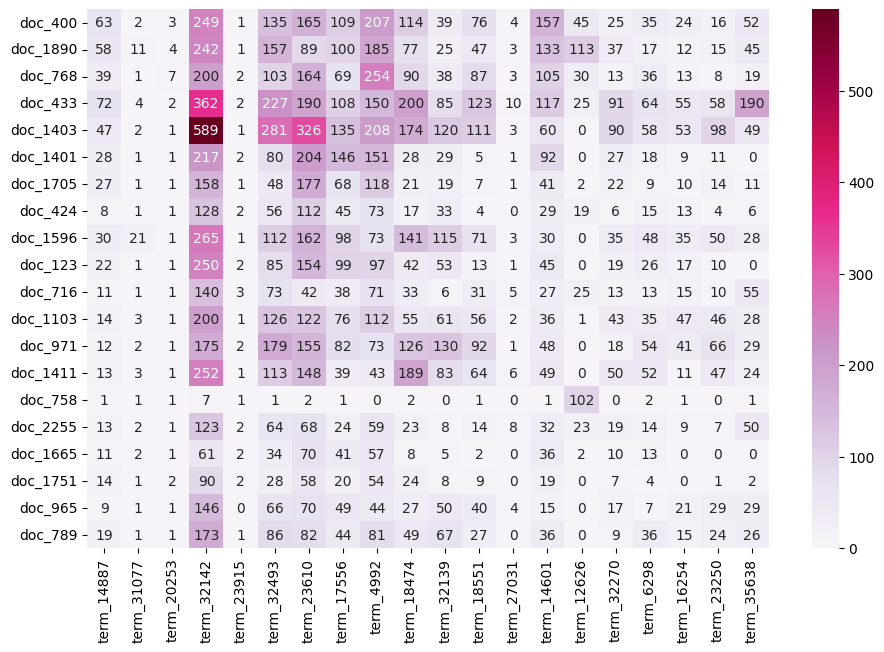

In [19]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(11, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=plot_z.max(), annot=True, fmt='d')

### Exercise 12

In [20]:
# Data Preparation
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [21]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(x=count_vect.get_feature_names_out()[:300],
                             y=term_frequencies[:300])])
fig.update_layout(width=1000,
                  height=400,
                  xaxis_title="Terms",
                  yaxis_title="Frequency",
                  xaxis_tickangle=90,
                  xaxis=dict(tickmode='array',
                             tickvals=list(range(len(term_frequencies))),
                             ticktext=count_vect.get_feature_names_out()[:300]))
fig.show()

### Exercise 13

In [22]:
# Show only if frequency > 2
x = np.array(count_vect.get_feature_names_out()[:300])
y = np.array(term_frequencies[:300])
x_filtered = x[y > 2]
y_filtered = y[y > 2]

In [23]:
fig = go.Figure(data=[go.Bar(x=x_filtered,y=y_filtered)])
fig.update_layout(width=1000,
                  height=400,
                  xaxis_title="Terms",
                  yaxis_title="Frequency",
                  xaxis_tickangle=90,
                  xaxis=dict(tickmode='array',
                             tickvals=list(range(len(term_frequencies))),
                             ticktext=count_vect.get_feature_names_out()[:300]))
fig.show()

### Exercise 14

In [24]:
# Sort in descending order, and show only if frequency > 2
sorted_indices = np.argsort(term_frequencies[:300])[::-1]
x_sorted = np.array(count_vect.get_feature_names_out()[:300])[sorted_indices]
y_sorted = np.array(term_frequencies[:300])[sorted_indices]
x_filtered = x_sorted[y_sorted > 2]
y_filtered = y_sorted[y_sorted > 2]

In [25]:
fig = go.Figure(data=[go.Bar(x=x_filtered,y=y_filtered)])
fig.update_layout(width=1000,
                  height=400,
                  xaxis_title="Terms",
                  yaxis_title="Frequency",
                  xaxis_tickangle=90,
                  xaxis=dict(tickmode='array',
                             tickvals=list(range(len(term_frequencies))),
                             ticktext=count_vect.get_feature_names_out()[:300]))
fig.show()

### Exercise 15

In [26]:
# Sort in descending order, and show only if frequency > 2, then take logarithm
import math
sorted_indices = np.argsort(term_frequencies[:300])[::-1]
x_sorted = np.array(count_vect.get_feature_names_out()[:300])[sorted_indices]
y_sorted = np.array(term_frequencies[:300])[sorted_indices]
x_filtered = x_sorted[y_sorted > 2]
y_filtered = y_sorted[y_sorted > 2]
y_filtered_log = [math.log(i) for i in y_filtered]

In [27]:
fig = go.Figure(data=[go.Bar(x=x_filtered,y=y_filtered_log)])
fig.update_layout(width=1000,
                  height=400,
                  xaxis_title="Terms",
                  yaxis_title="Frequency",
                  xaxis_tickangle=90,
                  xaxis=dict(tickmode='array',
                             tickvals=list(range(len(term_frequencies))),
                             ticktext=count_vect.get_feature_names_out()[:300]))
fig.show()

### Exercise 16

#### Setup

In [28]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

#### Top 5% terms

In [29]:
category_number = 0

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)[::-1]
sorted_counts = np.sort(word_counts)[::-1] 
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)
top_5_percent_indices = sorted_indices[:top_5_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: comp.graphics
Number of terms in top 5%: 687
Filtered terms: ['the', 'to', 'of', 'and', 'is', 'in', 'for', 'it', 'from', 'you', 'edu', 'that', 'on', 'this', 'or', 'be', 'with', 'have', 'lines', 'can', 'subject', 'are', 'graphics', 'if', 'organization', 'image', 'as', 'not', 'but', 'at', 'there', 'com', 'an', 'any', 'will', 'by', 'university', 're', 'about', 'some', 'posting', 'file', 'do', 'all', 'would', 'host', 'jpeg', 'what', 'so', 'nntp', 'has', 'files', 'which', 'one', 'also', 'me', 'use', 'software', 'was', 'my', 'images', 'writes', 'other', 'article', 'out', 'data', 'program', 'know', 'like', 'version', 'more', 'color', 'ftp', 'your', 'get', 'computer', 'don', '3d', 'does', 'no', 'mail', 'format', 'they', 'available', 'need', 'we', 'ca', 'thanks', 'just', 'bit', 'gif', 'how', 'help', 'am', 'please', 'package', 'pub', 'anyone', 'very', 'information', 'using', 'code', 'line', 'than', 'find', 'system', 'only', 'time', 'where', '24', 'windows', 'good', 'uk', 'cs', 'display

In [30]:
category_number = 1

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)[::-1]
sorted_counts = np.sort(word_counts)[::-1] 
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)
top_5_percent_indices = sorted_indices[:top_5_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: soc.religion.christian
Number of terms in top 5%: 693
Filtered terms: ['the', 'of', 'to', 'and', 'that', 'is', 'in', 'it', 'not', 'you', 'this', 'be', 'are', 'for', 'as', 'god', 'have', 'we', 'from', 'but', 'he', 'was', 'with', 'on', 'if', 'edu', 'they', 'what', 'by', 'there', 'or', 'can', 'all', 'do', 'who', 'one', 'would', 'about', 'my', 'his', 'will', 'at', 'subject', 'people', 'an', 'so', 'no', 'jesus', 'lines', 're', 'your', 'me', 'some', 'organization', 'which', 'has', 'when', 'their', 'our', 'think', 'were', 'any', 'know', 'church', 'believe', 'only', 'christians', 'other', 'does', 'us', 'don', 'because', 'how', 'been', 'writes', 'christian', 'him', 'christ', 'more', 'like', 'just', 'why', 'bible', 'say', 'may', 'had', 'out', 'also', 'then', 'faith', 'time', 'them', 'com', 'am', 'university', 'should', 'being', 'article', 'see', 'than', 'question', 'those', 'truth', 'did', 'good', 'these', 'even', 'up', 'rutgers', 'life', 'way', 'hell', 'many', 'very', '1993', 'true', 

In [31]:
category_number = 2

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)[::-1]
sorted_counts = np.sort(word_counts)[::-1] 
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)
top_5_percent_indices = sorted_indices[:top_5_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: sci.med
Number of terms in top 5%: 812
Filtered terms: ['the', 'of', 'to', 'and', 'in', 'is', 'that', 'it', 'for', 'edu', 'this', 'from', 'you', 'are', 'be', 'not', 'with', 'have', 'or', 'as', 'com', 'on', 'but', 'my', 'was', 'if', 'can', 'subject', 'organization', 'lines', 'at', 're', 'by', 'there', 'an', 'one', 'they', 'about', 'what', 'article', 'has', 'some', 'any', 'writes', 'your', 'would', 'do', 'will', 'no', 'all', 'me', 'which', 'who', 'cs', 'so', 'pitt', 'we', 'more', 'people', 'don', 'msg', 'other', 'university', 'science', 'he', 'like', 'also', 'when', 'know', 'been', 'out', 'gordon', 'their', 'had', 'use', 'get', 'these', 'banks', 'medical', 'health', 'just', 'geb', 'up', 'than', 'only', 'most', 'time', 'food', 'new', 'posting', 'she', 'very', 'think', 'were', 'may', 'disease', 'many', 'should', 'his', 'host', 'because', 'too', 'nntp', 'good', 'how', 'reply', 'does', 'am', 'such', 'patients', 'well', 'after', 'information', 'research', 'them', 'doctor', 'years', 

In [32]:
category_number = 3

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)[::-1]
sorted_counts = np.sort(word_counts)[::-1] 
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)
top_5_percent_indices = sorted_indices[:top_5_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: alt.atheism
Number of terms in top 5%: 598
Filtered terms: ['the', 'of', 'to', 'is', 'that', 'and', 'in', 'it', 'you', 'not', 'be', 'are', 'this', 'edu', 'for', 'have', 'from', 'as', 'but', 'or', 'if', 'on', 'was', 'an', 'what', 'they', 'god', 'we', 'by', 'one', 'with', 're', 'can', 'there', 'do', 'so', 'your', 'he', 'people', 'writes', 'no', 'com', 'all', 'subject', 'about', 'lines', 'would', 'who', 'at', 'some', 'don', 'organization', 'my', 'will', 'article', 'which', 'think', 'has', 'more', 'any', 'their', 'then', 'keith', 'than', 'his', 'does', 'me', 'say', 'how', 'atheists', 'posting', 'atheism', 'other', 'just', 'when', 'only', 'were', 'because', 'like', 'know', 'them', 'been', 'many', 'why', 'out', 'believe', 'being', 'such', 'well', 'nntp', 'even', 'host', 'see', 'could', 'religion', 'up', 'time', 'must', 'said', 'caltech', 'system', 'should', 'jesus', 'islam', 'evidence', 'something', 'us', 'way', 'here', 'morality', 'those', 'things', 'university', 'good', 'argument

#### Bottom 1% terms

In [33]:
category_number = 0

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)
sorted_counts = word_counts[sorted_indices]
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: comp.graphics
Number of terms in bottom 1%: 137
Filtered terms: ['initworld', 'jkpg', 'jiu1', 'jiu', 'jfreund', 'jeremy', 'jena', 'jem', 'jele', 'jeffrey', 'jbalgley', 'jasper', 'jancene', 'jaguar', 'jaggies', 'jagged', 'jaclyn', 'jacky', 'ja', 'ixos', 'ixels', 'ix', 'ivr', 'ivnorm', 'iv2scn', 'itri', 'itor', 'itnsg1', 'jman', 'itn', 'jna', 'joes', 'jump', 'juelin', 'judge', 'juan', 'jroberts', 'jr', 'jpsrc4', 'jplpost', 'jpgs', 'jpg95', 'jpg75', 'jpg5o', 'jpg50', 'jpg25', 'jpegv4', 'jpegsrc4', 'jpeged', 'jpeg4bin', 'jpeg4386', 'journalix', 'josephson', 'jong', 'joint', 'join', 'johnm', 'johnl', 'jogle', 'jobs', 'jun', 'ithil', 'iterate', 'ipsc2', 'ipcs', 'ipa', 'ious', 'ior', 'ions', 'iol', 'io', 'invited', 'invisible', 'investment', 'investigator', 'investigation', 'investigating', 'inversion', 'inventing', 'invent', 'invariants', 'invariably', 'inumerable', 'intuitive', 'introducing', 'intricacies', 'intervention', 'interval', 'interpretor', 'interpretations', 'ipu', 'iter

In [34]:
category_number = 1

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)
sorted_counts = word_counts[sorted_indices]
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: soc.religion.christian
Number of terms in bottom 1%: 138
Filtered terms: ['disparate', 'expose', 'explosive', 'resisting', 'exploitation', 'exploit', 'resolution', 'resort', 'resorted', 'resounding', 'expired', 'expound', 'resp', 'experimentation', 'respite', 'experiential', 'responsi', 'resson', 'expensive', 'expel', 'ressurrections', 'restarting', 'expectations', 'expertise', 'expectation', 'expounding', 'resistant', 'requisite', 'eyewitness', 'exuberant', 'extroverted', 'extremists', 'resemble', 'extrascriptural', 'extracted', 'resentful', 'extortion', 'resisted', 'extoll', 'externally', 'resentments', 'extensively', 'extension', 'extends', 'resepct', 'reservations', 'reserves', 'resigned', 'resistable', 'extirmination', 'ezekiel', 'expectancy', 'expansive', 'executive', 'execute', 'resul', 'resulting', 'excitement', 'exchanged', 'excessive', 'excerpted', 'excerpt', 'excercises', 'restricts', 'resurrec', 'excellently', 'excavated', 'excapes', 'exams', 'retained', 'retains'

In [35]:
category_number = 2

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)
sorted_counts = word_counts[sorted_indices]
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: sci.med
Number of terms in bottom 1%: 162
Filtered terms: ['íålittin', 'icl', 'icgln', 'iceskate', 'icemt', 'tti', 'ibuprophen', 'tty', 'tu', 'i3a', 'i001269', 'i000702', 'hypoxemia', 'hypothetical', 'hypothesised', 'icot', 'tuberculin', 'hyperextension', 'hyperestrogenemia', 'hyperdermic', 'hyped', 'hydroxy', 'hydrophilic', 'hydrolysis', 'hydrocarbons', 'hydraulic', 'hyde', 'hwdub', 'hvp', 'huynh_1', 'huynh', 'hypnotic', 'icrf', 'id', 'idbsu', 'truely', 'illustrative', 'illustrates', 'illuminating', 'illuminate', 'ills', 'trumpet', 'trust', 'trusted', 'illiac', 'truthful', 'ileostomy', 'tsamuel', 'ikeda', 'iip', 'iiir', 'ihave', 'ide', 'tthomps', 'idealized', 'ideally', 'identical', 'tsfsi', 'hutchinson', 'ideology', 'idiopathic', 'idiotic', 'idle', 'ifs', 'ig', 'ignition', 'idiocy', 'hutchins', 'husc3', 'husbandry', 'tulips', 'houxa', 'hou281', 'hou', 'hotheaded', 'hoth', 'hostage', 'tung', 'hospitality', 'hospitalised', 'hospitalisation', 'tunis', 'hoskins', 'hoseshoe', 'h

In [36]:
category_number = 3

word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
sorted_indices = np.argsort(word_counts)
sorted_counts = word_counts[sorted_indices]
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: alt.atheism
Number of terms in bottom 1%: 119
Filtered terms: ['zyklon', 'plagerize', 'disqualified', 'disproving', 'disproven', 'disproved', 'planners', 'dispossess', 'dispite', 'disperse', 'dispelled', 'dispassionately', 'plant', 'planted', 'plantinga', 'disobeying', 'disobey', 'dismissively', 'disregarding', 'disrespect', 'pl8', 'dissidents', 'divinely', 'pill', 'dividend', 'pillage', 'diverted', 'ping', 'diverge', 'diting', 'dismissing', 'disturb', 'district', 'pinnacle', 'distribute', 'distraction', 'pious', 'pipe', 'piqued', 'pitfall', 'distrust', 'piercing', 'plastic', 'disingenuous', 'discourse', 'discouraging', 'pnanci', 'pnyyvat', 'discount', 'po2', 'po3', 'disclaimed', 'discipline', 'poet', 'pof', 'disch', 'discarded', 'pogo', 'disbelieving', 'disbeliever', 'pointer', 'pmention', 'pmark', 'plurium', 'plurbis', 'plausable', 'dishes', 'pleading', 'disgust', 'disguised', 'disenfranchisement', 'pleasant', 'plight', 'platinga', 'ploy', 'plucke', 'plug', 'discriminatory'

#### Conclusion

In the top 5% terms, we can see there are many proper nouns in each specific discipline. For example, terms such as 'graphics', 'image', 'files', 'jpeg', 'gif' appears in the comp.graphics category; and 'god', 'believe', 'church', 'christians' appears in the soc.religion.christian category.

The most common words in English, such as 'the', 'to', 'of', 'and', 'is', 'in', 'for', 'it', 'from', 'you', appears in all categories.

In the bottom 1% terms, we find that in all category, there is some terms that is not really a word. For example, 'jr', 'io', 'l4v' in comp.graphics; 'f14', 'f15', 'fe', 'fc' in soc.religion.christian; 'íålittin', 'icl', 'tti', 'i3a' in sci.med; 'pl8', 'po2', 'po3' in alt.atheism.

### Exercise 17

#### Setup

In [37]:
category_number = 0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]


For category comp.graphics we filter the following words:
Bottom 1.0% words: 
initworld    1
jkpg         1
jiu1         1
jiu          1
jfreund      1
            ..
lab2         1
laaksone     1
l4v          1
l300         1
l14h11       1
Length: 137, dtype: int64
Top 5.0% words: 
40               27
distributed      27
open             27
multi            27
getting          27
               ... 
is             1751
and            2382
of             2470
to             2775
the            4537
Length: 687, dtype: int64

For category soc.religion.christian we filter the following words:
Bottom 1.0% words: 
disparate       1
expose          1
explosive       1
resisting       1
exploitation    1
               ..
fence           1
feminist        1
remarriage      1
remarried       1
remeber         1
Length: 138, dtype: int64
Top 5.0% words: 
pagan        36
claims       36
gave         36
parts        36
jr           37
          ...  
that       4393
and        4409
to        

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
#from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    #obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

#### FAE Top-K

The following code is modified from the official tutorial:
https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/topk/FAE.ipynb#scrollTo=fG7RNIT0X7uH

 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.
 TopK frequent patterns were successfully generated using FAE algorithm.
  algorithm  minSup  patterns   runtime     memory
0       FAE     500       500  1.142699  963788800
1       FAE    1000      1000  2.121061  963624960
2       FAE    1500      1500  5.015570  964919296


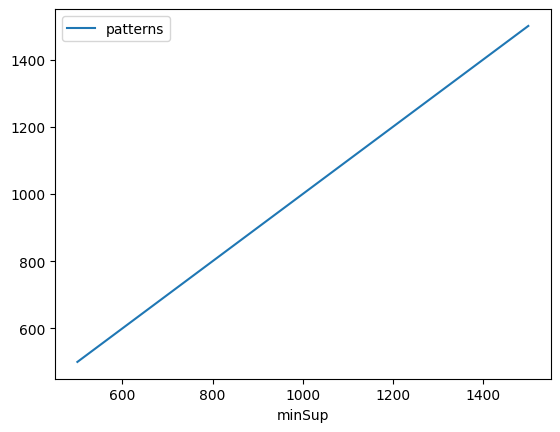

Graph for No Of Patterns is successfully generated!


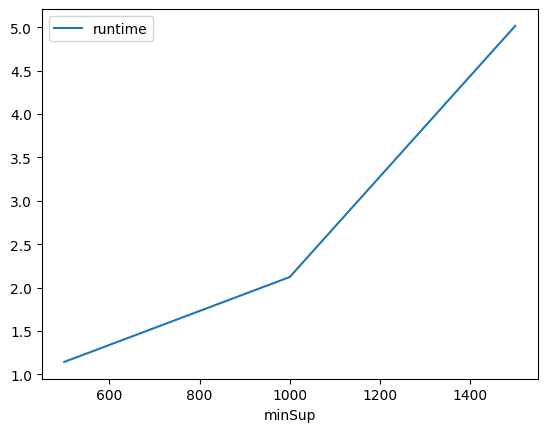

Graph for Runtime taken is successfully generated!


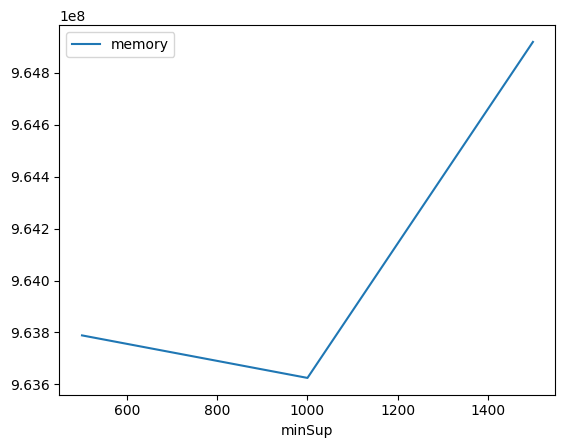

Graph for memory consumption is successfully generated!


In [39]:
from PAMI.frequentPattern.topk import FAE as alg
from PAMI.extras.graph import plotLineGraphsFromDataFrame as plt
import pandas as pd

minimumSupportCountList = [500, 1000, 1500]
result = pd.DataFrame(columns=['algorithm', 'minSup', 'patterns', 'runtime', 'memory'])

algorithm = 'FAE'
frequentPatternsDF_comp_graphics_dict = dict.fromkeys(minimumSupportCountList)
for minSupCount in minimumSupportCountList:
    obj = alg.FAE('td_freq_db_comp_graphics.csv', k=minSupCount, sep='\t')
    obj.mine()
    frequentPatternsDF_comp_graphics_dict[minSupCount] = obj.getPatternsAsDataFrame()
    result.loc[result.shape[0]] = [algorithm, minSupCount, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]

print(result)
ab = plt.plotGraphsFromDataFrame(result)
ab.plotGraphsFromDataFrame()

In [40]:
for minSupCount in minimumSupportCountList:
    print(f'k = {minSupCount}:')
    print(frequentPatternsDF_comp_graphics_dict[minSupCount])

k = 500:
                                              Patterns  Support
0                                                maybe       26
1                                                 life       24
2                                                ideas       24
3                                                 feel       24
4                                                tried       24
..                                                 ...      ...
495  awful posts curious concerning proposed learn ...       12
496  posts curious concerning proposed learn forum ...       12
497  convenience posts curious concerning proposed ...       12
498  posts curious concerning proposed learn forum ...       12
499  posts curious concerning proposed learn forum ...       12

[500 rows x 2 columns]
k = 1000:
                                              Patterns  Support
0                                                maybe       26
1                                                 life       

#### MaxFPGrowth

The following code is modified from the official tutorial:
https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/maximal/MaxFPGrowth.ipynb

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
      algorithm  minSup  patterns    runtime     memory
0  maxFP-growth       3      6872  25.782310  983367680
1  maxFP-growth       6      1340   0.346049  978944000
2  maxFP-growth       9       660   0.290158  978944000


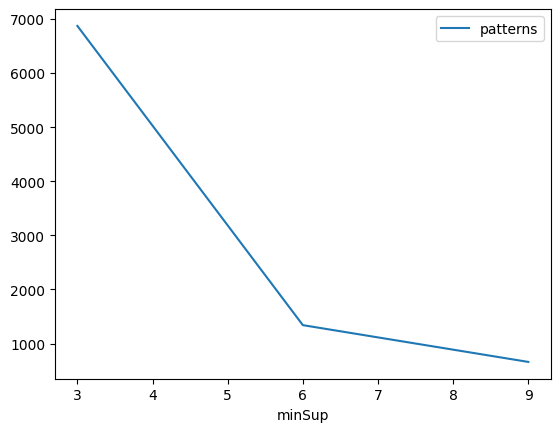

Graph for No Of Patterns is successfully generated!


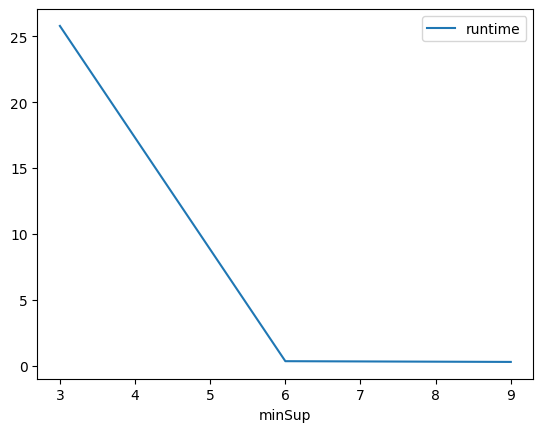

Graph for Runtime taken is successfully generated!


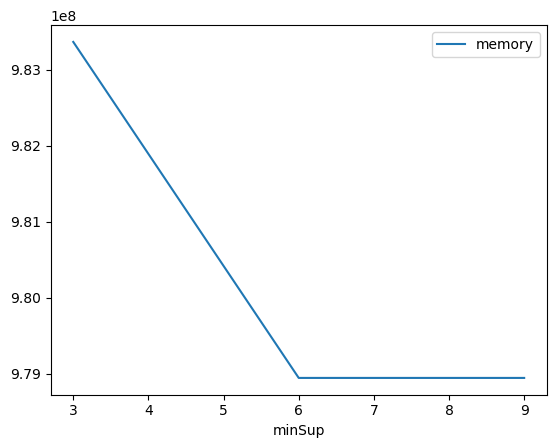

Graph for memory consumption is successfully generated!


In [41]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as alg #import the algorithm
from PAMI.extras.graph import plotLineGraphsFromDataFrame as plt
import pandas as pd

minimumSupportCountList = [3, 6, 9]
result = pd.DataFrame(columns=['algorithm', 'minSup', 'patterns', 'runtime', 'memory'])

algorithm = 'maxFP-growth'
frequentPatternsDF_comp_graphics_dict = dict.fromkeys(minimumSupportCountList)
for minSupCount in minimumSupportCountList:
    obj = alg.MaxFPGrowth('td_freq_db_comp_graphics.csv', minSup=minSupCount, sep='\t')
    obj.mine()
    frequentPatternsDF_comp_graphics_dict[minSupCount] = obj.getPatternsAsDataFrame()
    result.loc[result.shape[0]] = [algorithm, minSupCount, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]

print(result)
ab = plt.plotGraphsFromDataFrame(result)
ab.plotGraphsFromDataFrame()

In [42]:
for minSupCount in minimumSupportCountList:
    print(f'minSup = {minSupCount}:')
    print(frequentPatternsDF_comp_graphics_dict[minSupCount])

minSup = 3:
                                               Patterns  Support
0     due bytes responsible 000 opinion 640x480 rob ...        3
1                                                  bag         3
2                                          garbo uwasa         3
3             wrong 200 responsible 000 umn 480 640 tc         3
4                                responsible 000 essex         3
...                                                 ...      ...
6867                                    didn wondering         3
6868                             feel wrong personally         3
6869                                     wrong correct         3
6870                                      life correct         3
6871                                        maybe life         4

[6872 rows x 2 columns]
minSup = 6:
                                 Patterns  Support
0                              tim brock         6
1                                   face         6
2                 

#### Conclusion

The result of FAE Top-K and MaxFPGrowth have some similarities with the result of FPGrowth algorithm, for instance, the pattern such as 'maybe', 'ideas', 'life' with larger support occur in all results. But the FPGrowth algorithm gives mostly a single word as a pattern, while the FAE Top-K and MaxFPGrowth algorithms gives long sentences as patterns with have smaller support.

As for the performance, the FAE Top-K algorithm runs faster for lower minSup value; while the MaxFPGrowth algorithm runs faster for higher minSup value. The memory usage of both algorithms do not differ significantly.

### Exercise 18

#### Setup

In [43]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.2048041820526123


In [44]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.21575713157653809


In [45]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.1403660774230957


In [46]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.2618429660797119


In [47]:
import pandas as pd

# We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]

# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                        Patterns  Support
19911                        gov       33
19912                  institute       33
57158                    snm6394       32
19910                       form       31
57156                    deleted       30
...                          ...      ...
54045  axes funds motss matching        9
54044   boy funds motss matching        9
54043    boy axes motss matching        9
54042    et funds motss matching        9
0                          swell        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


In [48]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Data Preparation

In [49]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

X_pca_tdm = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

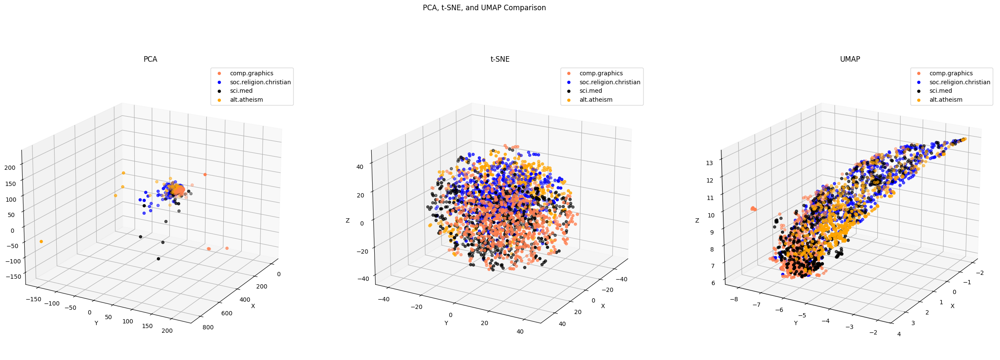

In [50]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

fig = plt.figure(figsize=(30, 10))  # Create a single figure
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        zs = X_reduced[X['category_name'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Specify the elevation and azimuth 
elev = 20
azim = 30

ax1 = fig.add_subplot(131, projection='3d')
plot_scatter(ax1, X_pca_tdm, 'PCA')
ax1.view_init(elev=elev, azim=azim)

ax2 = fig.add_subplot(132, projection='3d')
plot_scatter(ax2, X_tsne_tdm, 't-SNE')
ax2.view_init(elev=elev, azim=azim)

ax3 = fig.add_subplot(133, projection='3d')
plot_scatter(ax3, X_umap_tdm, 'UMAP')
ax3.view_init(elev=elev, azim=azim)

plt.show()

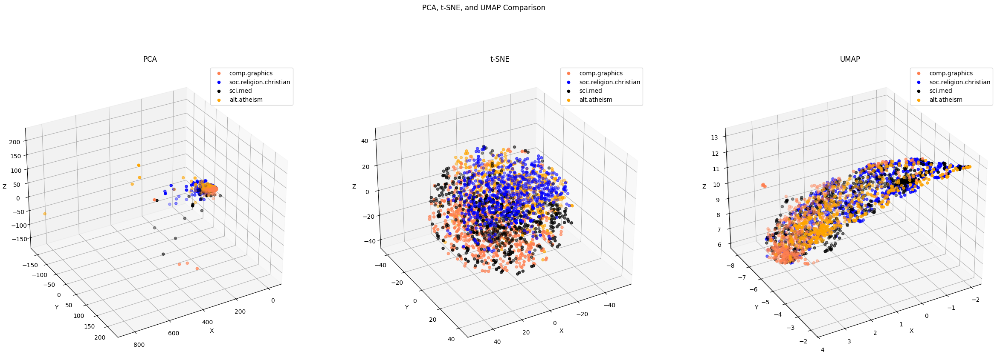

In [51]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

fig = plt.figure(figsize=(30, 10))  # Create a single figure
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        zs = X_reduced[X['category_name'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Specify the elevation and azimuth 
elev = 30
azim = 60

ax1 = fig.add_subplot(131, projection='3d')
plot_scatter(ax1, X_pca_tdm, 'PCA')
ax1.view_init(elev=elev, azim=azim)

ax2 = fig.add_subplot(132, projection='3d')
plot_scatter(ax2, X_tsne_tdm, 't-SNE')
ax2.view_init(elev=elev, azim=azim)

ax3 = fig.add_subplot(133, projection='3d')
plot_scatter(ax3, X_umap_tdm, 'UMAP')
ax3.view_init(elev=elev, azim=azim)

plt.show()

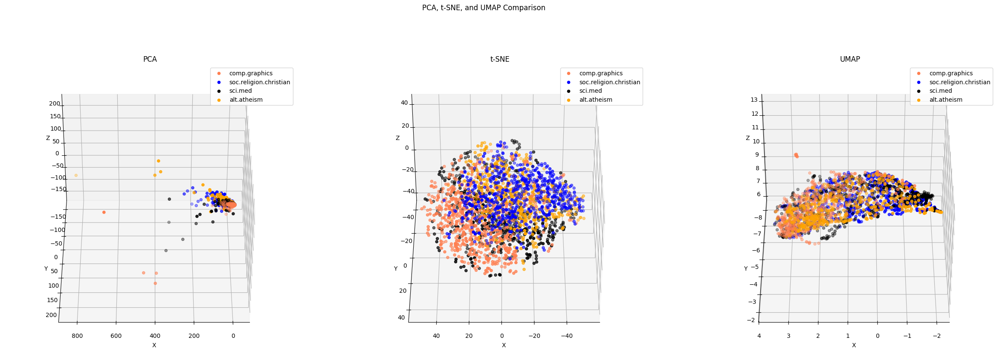

In [52]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

fig = plt.figure(figsize=(30, 10))  # Create a single figure
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category][:, 0]
        ys = X_reduced[X['category_name'] == category][:, 1]
        zs = X_reduced[X['category_name'] == category][:, 2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Specify the elevation and azimuth 
elev = 40
azim = 90

ax1 = fig.add_subplot(131, projection='3d')
plot_scatter(ax1, X_pca_tdm, 'PCA')
ax1.view_init(elev=elev, azim=azim)

ax2 = fig.add_subplot(132, projection='3d')
plot_scatter(ax2, X_tsne_tdm, 't-SNE')
ax2.view_init(elev=elev, azim=azim)

ax3 = fig.add_subplot(133, projection='3d')
plot_scatter(ax3, X_umap_tdm, 'UMAP')
ax3.view_init(elev=elev, azim=azim)

plt.show()

#### Conclusion

The data points in the left plot appear to be quite clustered together, suggesting that PCA did not separate the categories effectively, since PCA is not good at capturing non-linear relationships.

The middle and the right plots show more separation between different categories. This shows that t-SNE and UMAP both provide better category separation than PCA for non-linear relationships.

### Exercise 19

In [53]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category_name)
bin_cat_catname_list = mlb.transform(X['category_name']).tolist()
X['bin_category'] = bin_cat_catname_list

In [54]:
X[0:9]

,text,category,category_name,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"{LaserJet, The, way, III?, x3769, Please, M.P....","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"{Background, I, help, The, there, irritated, :...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"{higher, seven, Diego, hateful, 5, that, doing...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"{fill, 1989., Rijksuniversiteit, (M.M., educat...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"{I, The, man,, put, stanly@grok11.columbiasc.n...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"{acknowledge, trying, Applied, The, necessary....","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"{quick, The, about, teach, instances., Please,...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"{His, appearance., treatment, chin, that, conv...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"{I, there, color, Explain., are, that, red-gre...","[0, 0, 1, 0]"


In [55]:
mlb.fit(X.category)
bin_cat_cat_list = mlb.transform(X['category']).tolist()
print(bin_cat_cat_list == bin_cat_catname_list)
# It works, and it gives the same 'bin_category'

True


---

## 2. New Dataset

### Data Preparation and Transformation

In [56]:
import pandas as pd
df = pd.read_csv("./Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")
df

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...
...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,....."
1496,not nostalgia,it's sad this is such a beautiful song when yo...
1497,not nostalgia,"Dear Friend, I think age and time is not that ..."
1498,nostalgia,I was born in 1954 and started to be aware of ...


In [57]:
# Now the csv file is converted into a pandas dataframe
type(df)

pandas.core.frame.DataFrame

---

### Data Cleaning

In [58]:
df.isnull()

,sentiment,comment
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
1495,False,False
1496,False,False
1497,False,False
1498,False,False


In [59]:
df.isnull().sum()

sentiment    0
comment      0
dtype: int64

The above shows that this dataset has no null value.

In [60]:
sum(df.duplicated())
# There is a duplicated data

1

In [61]:
df.drop_duplicates(keep="first", inplace=True)
sum(df.duplicated())
# Remove the duplicated data

0

---

### Data Preprocessing - Sampling

In [62]:
import matplotlib.pyplot as plt
%matplotlib inline

In [63]:
print(df.sentiment.value_counts())
df_sample = df.sample(n=500)
print(df_sample.sentiment.value_counts())

sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64
sentiment
not nostalgia    253
nostalgia        247
Name: count, dtype: int64


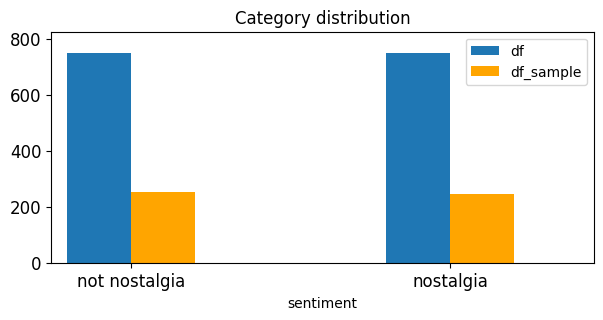

In [64]:
fig, ax = plt.subplots(figsize=(7, 3))
upper_bound = max(max(df.sentiment.value_counts()), max(df_sample.sentiment.value_counts())) * 1.1

df.sentiment.value_counts().plot(kind='bar',
                                ax=ax,
                                position=1,
                                width=0.2,
                                title='Category distribution',
                                ylim=[0, upper_bound],
                                rot=0, fontsize=12)

df_sample.sentiment.value_counts().plot(kind='bar',
                                        ax=ax,
                                        color='orange',
                                        position=0,
                                        width=0.2,
                                        ylim=[0, upper_bound],
                                        rot=0, fontsize=12)

plt.legend(['df', 'df_sample'])
plt.show()

#### Data Preprocessing - Feature Creation

In [65]:
import nltk
import helpers.data_mining_helpers as dmh
df['unigrams'] = df['comment'].apply(lambda x: dmh.tokenize_text(x))

In [66]:
df

,sentiment,comment,unigrams
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t..."
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene..."
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na..."
4,nostalgia,listening to his songs reminds me of my mum wh...,"[listening, to, his, songs, reminds, me, of, m..."
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....","[i, do, n't, know, !, .., but, the, opening, o..."
1496,not nostalgia,it's sad this is such a beautiful song when yo...,"[it, 's, sad, this, is, such, a, beautiful, so..."
1497,not nostalgia,"Dear Friend, I think age and time is not that ...","[Dear, Friend, ,, I, think, age, and, time, is..."
1498,nostalgia,I was born in 1954 and started to be aware of ...,"[I, was, born, in, 1954, and, started, to, be,..."


### Data Preprocessing - Feature Subset Selection

In [67]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
df_counts = count_vect.fit_transform(df.comment) #learn the vocabulary and return document-term matrix
print(df_counts[0])

  (np.int32(0), np.int32(1598))	1
  (np.int32(0), np.int32(3570))	2
  (np.int32(0), np.int32(2973))	1
  (np.int32(0), np.int32(3650))	1
  (np.int32(0), np.int32(1470))	1
  (np.int32(0), np.int32(3534))	1
  (np.int32(0), np.int32(3282))	1
  (np.int32(0), np.int32(2028))	1
  (np.int32(0), np.int32(3336))	1
  (np.int32(0), np.int32(1606))	1
  (np.int32(0), np.int32(233))	2
  (np.int32(0), np.int32(3284))	3
  (np.int32(0), np.int32(3328))	2
  (np.int32(0), np.int32(1651))	2
  (np.int32(0), np.int32(1512))	1
  (np.int32(0), np.int32(1249))	1
  (np.int32(0), np.int32(323))	1
  (np.int32(0), np.int32(214))	1
  (np.int32(0), np.int32(2341))	1
  (np.int32(0), np.int32(15))	1
  (np.int32(0), np.int32(1733))	1
  (np.int32(0), np.int32(3304))	1
  (np.int32(0), np.int32(907))	1
  (np.int32(0), np.int32(258))	2
  (np.int32(0), np.int32(3124))	1
  (np.int32(0), np.int32(2328))	2
  (np.int32(0), np.int32(245))	1
  (np.int32(0), np.int32(3581))	1
  (np.int32(0), np.int32(1591))	1
  (np.int32(0), np.int

In [68]:
# Size of the term-document matrix
df_counts.shape

(1499, 3730)

In [69]:
# We choose the rows and cols with least zeros
matrix_size = 20
row_nnzcounts = np.array(df_counts.getnnz(axis=1))
col_nnzcounts = np.array(df_counts.getnnz(axis=0))
top_rows = np.argsort(-row_nnzcounts)[:matrix_size]
top_cols = np.argsort(-col_nnzcounts)[:matrix_size]

plot_x = ["term_"+str(i) for i in top_cols]
plot_y = ["doc_"+str(i) for i in top_rows]
plot_z = df_counts[top_rows][:, top_cols].toarray()
plot_z

array([[6, 1, 3, 1, 1, 0, 2, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [1, 1, 3, 1, 1, 2, 1, 4, 1, 3, 0, 0, 1, 1, 1, 0, 0, 2, 0, 0],
       [0, 2, 1, 3, 0, 0, 1, 1, 3, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0],
       [2, 2, 3, 4, 1, 0, 2, 3, 1, 1, 2, 0, 0, 0, 0, 0, 0, 1, 0, 2],
       [4, 1, 0, 1, 0, 0, 0, 0, 0, 2, 0, 3, 0, 1, 0, 2, 0, 1, 0, 0],
       [4, 2, 1, 2, 3, 4, 1, 3, 1, 2, 0, 1, 0, 1, 2, 0, 0, 0, 2, 0],
       [5, 1, 2, 6, 0, 0, 0, 3, 1, 2, 3, 0, 1, 1, 2, 1, 0, 2, 0, 0],
       [5, 5, 1, 0, 4, 2, 0, 4, 4, 1, 0, 0, 2, 1, 2, 0, 0, 0, 0, 0],
       [6, 0, 1, 4, 0, 0, 2, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0],
       [1, 3, 0, 1, 3, 3, 2, 1, 1, 5, 0, 2, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 3, 1, 1, 1, 3, 1, 2, 6, 3, 1, 1, 0, 1, 2, 0, 0, 1, 0, 0],
       [3, 1, 1, 4, 1, 1, 3, 1, 0, 2, 0, 1, 0, 0, 0, 2, 1, 0, 0, 0],
       [1, 2, 4, 4, 2, 3, 1, 1, 2, 0, 2, 1, 3, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 5, 3, 0, 3, 1, 0, 2, 0, 0, 0, 2, 1, 0, 4, 0, 0, 0, 2],
       [2, 3, 1, 1, 3, 1, 1, 2, 2,

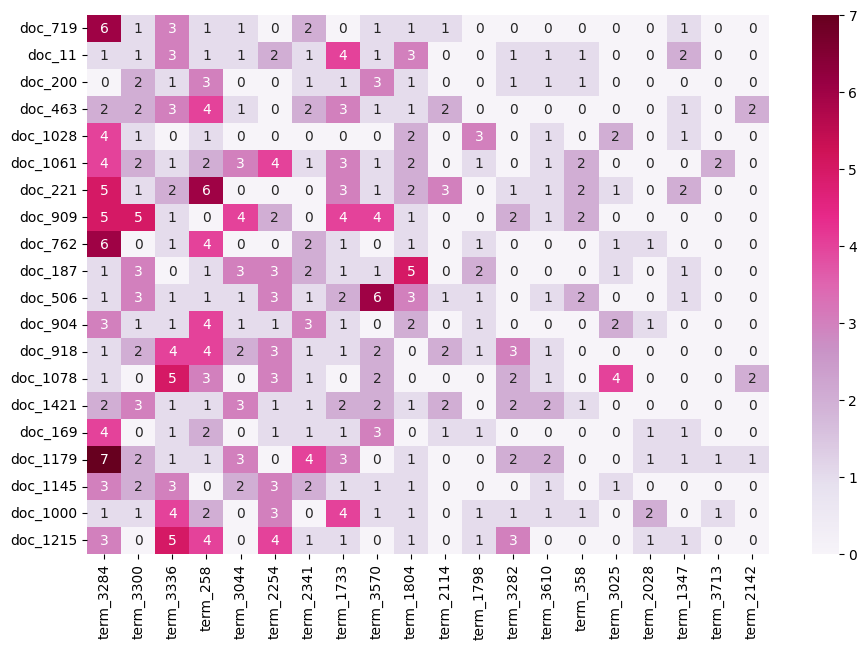

In [70]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(11, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=plot_z.max(), annot=True, fmt='d')

### Data Preprocessing - Attribute Transformation / Aggregation

In [71]:
term_frequencies = []
for j in range(0,df_counts.shape[1]):
    term_frequencies.append(sum(df_counts[:,j].toarray()))

In [72]:
term_frequencies = np.asarray(df_counts.sum(axis=0))[0]

/var/folders/nr/39wv37px7zlb_r27bx7vk4t80000gr/T/ipykernel_41484/3135219654.py:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



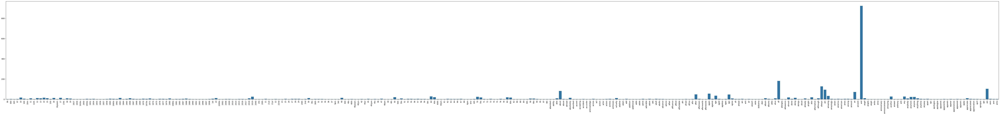

In [73]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], 
                y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

In the following, we sort the terms by their frequencies in descending order, and visualize the frequency logarithmically.

In [74]:
# Sort in descending order, and show only if frequency > 2, then take logarithm
import math
sorted_indices = np.argsort(term_frequencies[:300])[::-1]
x_sorted = np.array(count_vect.get_feature_names_out()[:300])[sorted_indices]
y_sorted = np.array(term_frequencies[:300])[sorted_indices]
x_filtered = x_sorted[y_sorted > 2]
y_filtered = y_sorted[y_sorted > 2]
y_filtered_log = [math.log(i) for i in y_filtered]

In [75]:
fig = go.Figure(data=[go.Bar(x=x_filtered,y=y_filtered_log)])
fig.update_layout(width=1000,
                  height=400,
                  xaxis_title="Terms",
                  yaxis_title="Frequency",
                  xaxis_tickangle=90,
                  xaxis=dict(tickmode='array',
                             tickvals=list(range(len(term_frequencies))),
                             ticktext=count_vect.get_feature_names_out()[:300]))
fig.show()

### Preprocessing - Finding Frequent Pattern

In [76]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

categories = df['sentiment'].unique()
category_dfs = {}
for category in categories:
    category_dfs[category] = df[df['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(x):
    count_vect = CountVectorizer()
    df_counts = count_vect.fit_transform(x['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(df_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [77]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number = 0 #You can change it from 0 to 1
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


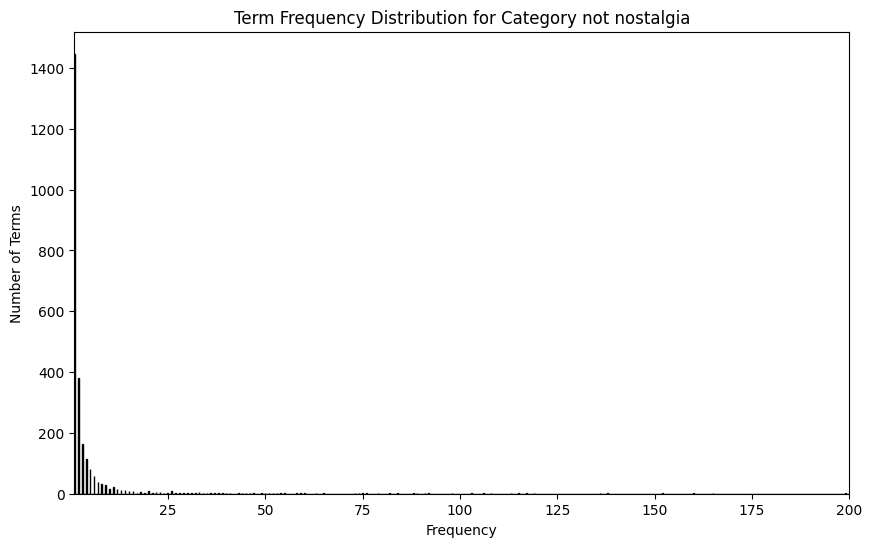

In [78]:
# Sum over all documents to get total frequency for each word
category_number = 0 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

Then we filter the bottom 1% and top 5% words based on their sum across all comments:

In [79]:
category_number = 0 # You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    word_sums = term_document_df.sum(axis=0)
    sorted_words = word_sums.sort_values()
    
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)

    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}')
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}')
    
    return term_document_df.drop(columns=words_to_remove)

term_document_dfs = {}
for category in categories:
    print(f'\nFor category \'{category}\' we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]


For category 'not nostalgia' we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 5.0% words: 
got         23
amazing     23
first       23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For category 'nostalgia' we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row     

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [80]:
#from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    category_safe = category.replace('.', '_')
    category_safe = category_safe.replace(' ', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    #obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 745
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.410738255033557
Maximum Transaction Size : 46
Standard Deviation Transaction Size : 5.926429722323316
Variance in Transaction Sizes : 35.16977700801039
Sparsity : 0.9965614316210002


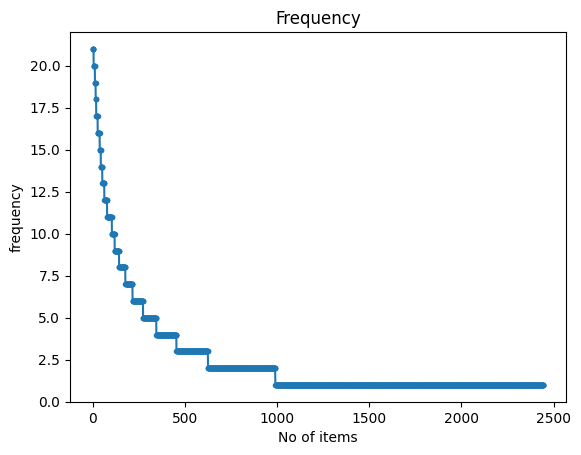

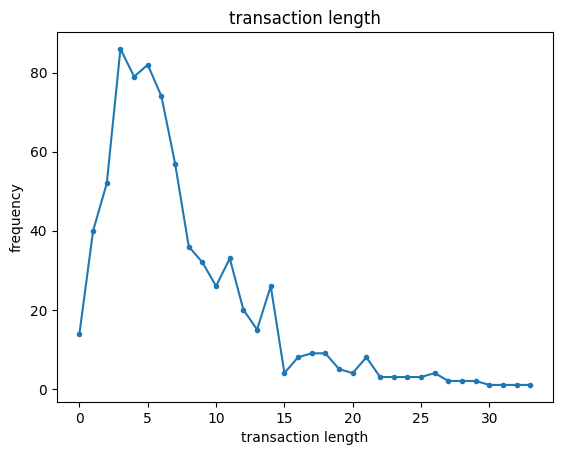

In [81]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_not_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.693460490463215
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.213372063492091
Variance in Transaction Sizes : 52.103722524357735
Sparsity : 0.9959733855996001


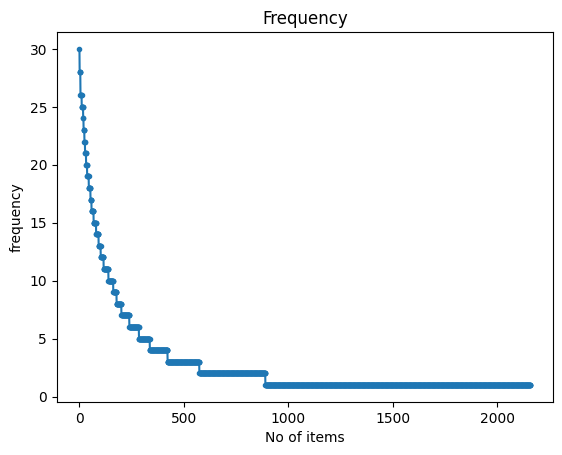

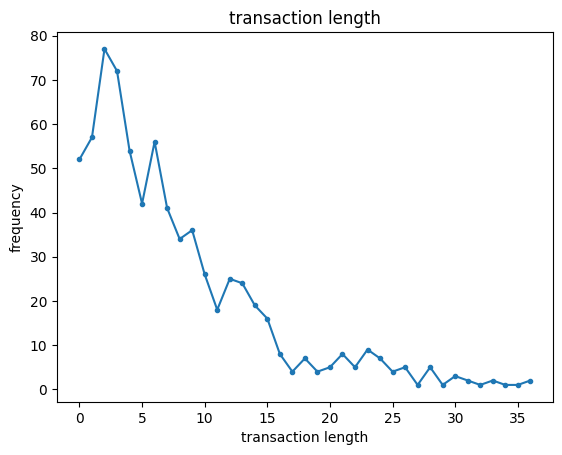

In [82]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [83]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup = 9
obj1 = alg.FPGrowth(iFile='td_freq_db_not_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_not_nostalgia = obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.007566213607788086


In [84]:
obj1.save('freq_patterns_not_nostalgia_minSup9.txt') #save the patterns
frequentPatternsDF_not_nostalgia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,every,21
140,loved,21
141,classic,21
142,them,21


In [85]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup = 9
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia = obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.011275053024291992


In [86]:
obj1.save('freq_patterns_nostalgia_minSup9.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,will,28
178,go,28


In [87]:
import pandas as pd

# We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_not_nostalgia, frequentPatternsDF_nostalgia]
pattern_counts = {}
for item in dfs:
    for pattern in item['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(item) for item in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for item in dfs:
    filtered_df = item[item['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

      Patterns  Support
219       will       28
218      would       28
217       ever       28
216       wish       26
215         or       26
..         ...      ...
96       along        9
1      special        9
95    together        9
94        left        9
0    favorites        9

[220 rows x 2 columns]
Number of patterns discarded: 104


In [88]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
df_tdm = count_vect.fit_transform(df['comment'])
terms = count_vect.get_feature_names_out()

# Tokenize the sentences into sets of unique words
df['tokenized_text'] = df['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=df.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(df_tdm.toarray(), columns=terms, index=df.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Data Preprocessing - Dimensionality Reduction

In [89]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

# Apply PCA, t-SNE, and UMAP to the data
df_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [90]:
print(f'PCA: {df_pca_tdm.shape}')
print(f't-SNE: {df_tsne_tdm.shape}')
print(f'UMAP: {df_umap_tdm.shape}')

PCA: (1499, 2)
t-SNE: (1499, 2)
UMAP: (1499, 2)


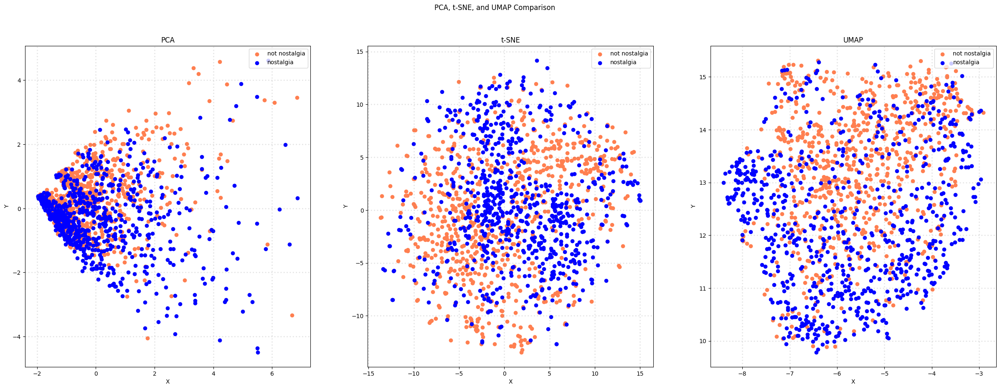

In [91]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_tdm, 'PCA')
plot_scatter(axes[1], df_tsne_tdm, 't-SNE')
plot_scatter(axes[2], df_umap_tdm, 'UMAP')

plt.show()

Now let's try in tandem with our pattern augmented data:

In [92]:
df_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

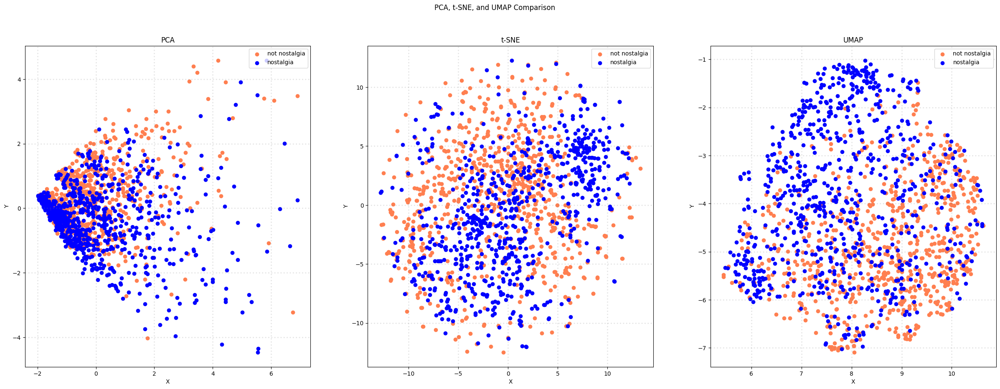

In [93]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_aug, 'PCA')
plot_scatter(axes[1], df_tsne_aug, 't-SNE')
plot_scatter(axes[2], df_umap_aug, 'UMAP')

plt.show()

### Data Preprcoessing - Discretization and Binarization

In [94]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(df.sentiment)

LabelBinarizer()

In [95]:
df['bin_category'] = mlb.transform(df['sentiment']).tolist()
df

,sentiment,comment,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t...","{have, and, I, days, we, vouch, life., at, Tha...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene...","{and, I, The, a, of, him, kid, an, forgotten, ...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{little, have, simple, and, I, early., sweet,,...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{some, 1st, served, have, 30, and, I, Mary, Th...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,"[listening, to, his, songs, reminds, me, of, m...","{his, songs, mum, played, everyday, of, my, to...",[0]
...,...,...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....","[i, do, n't, know, !, .., but, the, opening, o...","{opening, of, know!..but, suggest, that, i, th...",[1]
1496,not nostalgia,it's sad this is such a beautiful song when yo...,"[it, 's, sad, this, is, such, a, beautiful, so...","{sad, and, a, him, you, really, song, it's, to...",[1]
1497,not nostalgia,"Dear Friend, I think age and time is not that ...","[Dear, Friend, ,, I, think, age, and, time, is...","{am, and, I, important, that, you, song., Dear...",[1]
1498,nostalgia,I was born in 1954 and started to be aware of ...,"[I, was, born, in, 1954, and, started, to, be,...","{popular, have, and, I, captured, there, 5, at...",[0]


### Data Exploration

In [96]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = df.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [97]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [98]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


/var/folders/nr/39wv37px7zlb_r27bx7vk4t80000gr/T/ipykernel_41484/452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/nr/39wv37px7zlb_r27bx7vk4t80000gr/T/ipykernel_41484/452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/nr/39wv37px7zlb_r27bx7vk4t80000gr/T/ipykernel_41484/452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/nr/39wv37px7zlb_r27bx7vk4t80000gr/T/ipykernel_41484/452772485.py:17: Dep

### Data Classification

In [99]:
sentiment_dict = {'not nostalgia': 0, 'nostalgia': 1}
df['sentiment_index'] = df.sentiment.map(sentiment_dict)

In [100]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['sentiment_index', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, df['sentiment'], test_size=0.3, random_state=42)

In [101]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [102]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [103]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8222    0.9528    0.8827       233
    nostalgia     0.9389    0.7788    0.8514       217

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [104]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['sentiment_index', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df['sentiment'], test_size=0.3, random_state=42)

In [105]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [106]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [107]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8644444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8185    0.9485    0.8787       233
    nostalgia     0.9333    0.7742    0.8463       217

     accuracy                         0.8644       450
    macro avg     0.8759    0.8613    0.8625       450
 weighted avg     0.8739    0.8644    0.8631       450



---

## 3. New Dataset (Continue)

### Some Data Visualizations

#### Word Cloud

In [108]:
# Install wordcloud
!pip install wordcloud

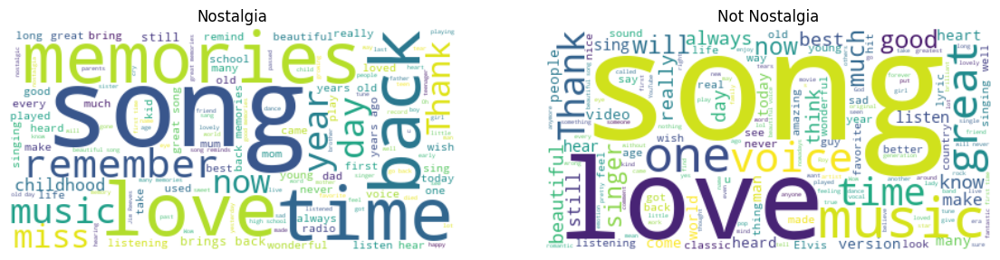

In [109]:
from wordcloud import WordCloud

nostalgia_comments = ' '.join(df[df['sentiment'] == 'nostalgia']['comment'])
not_nostalgia_comments = ' '.join(df[df['sentiment'] == 'not nostalgia']['comment'])

plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
wordcloud_nostalgia = WordCloud(background_color='white').generate(nostalgia_comments)
plt.imshow(wordcloud_nostalgia, interpolation='bilinear')
plt.axis('off')
plt.title('Nostalgia')

plt.subplot(1, 2, 2)
wordcloud_not_nostalgia = WordCloud(background_color='white').generate(not_nostalgia_comments)
plt.imshow(wordcloud_not_nostalgia, interpolation='bilinear')
plt.axis('off')
plt.title('Not Nostalgia')

plt.show()

#### Dimensionality Reduction

In [110]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['comment'])
terms = count_vect.get_feature_names_out()
X['tokenized_text'] = X['comment'].str.split().apply(set)

pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

KeyError: 'comment'

In [ ]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [ ]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

### Generate TF-IDF features

Generate TF-IDF features from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). 

In [ ]:
import pandas as pd
X = pd.read_csv("./Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X_tdm = vectorizer.fit_transform(X['comment'].tolist())
terms = vectorizer.get_feature_names_out()

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_tfidf_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_tfidf_df = pd.concat([tdm_tfidf_df, pattern_matrix], axis=1)
augmented_tfidf_df

### Naïve Bayes Classifiers

Implement a simple Naive Bayes classifier that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences. 

Multinomial NB Classifier + Word Frequency:

In [ ]:
# Model with only the document-term frequency data
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Convert sentiment labels to numerical values
sentiment_dict = {'not nostalgia': 0, 'nostalgia': 1}
X['sentiment_index'] = X['sentiment'].map(sentiment_dict)
category_mapping = dict(X[['sentiment_index', 'sentiment']].drop_duplicates().values)
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['sentiment'], test_size=0.3, random_state=42)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

TF-IDF + Bernoulli NB Classifier:

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report, accuracy_score

# Convert sentiment labels to numerical values
sentiment_dict = {'not nostalgia': 0, 'nostalgia': 1}
X['sentiment_index'] = X['sentiment'].map(sentiment_dict)
category_mapping = dict(X[['sentiment_index', 'sentiment']].drop_duplicates().values)
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_tfidf_df, X['sentiment_index'], test_size=0.3, random_state=42)

# Train the Bernoulli Naive Bayes classifier
bnb_classifier = BernoulliNB()
bnb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = bnb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

In our result, the Bernoulli NB Classifier with the TF-IDF feature gives a better result than the multinomial NB Classifier with the word frequency feature. But their accuracy is close, not differ significantly, hence it is hard to conclude a reason for these results.

---

## 4. Improvements

Data preprocessing needs some trial-and-error in order to find potentional relationship within the dataset. In this Lab, some common technique was demonstrated, but some of the visualizations are not very meaningful for this specific dataset. Furthermore, for each preprocessing technique, we should try different parameters, and obtain the better solution for preprocessing.

To improve this, I will try different methods and parameters, and give an descriptive analysis about each approch, then conclude, then conclude an optimal solution for the problem.

---